In [1]:
# Import the research library 
from benchmarklib import BenchmarkDatabase, CliqueProblem, CliqueTrial

import matplotlib.pyplot as plt

In [2]:
# Load Qiskit
from qiskit_ibm_runtime import QiskitRuntimeService
from dotenv import load_dotenv, find_dotenv
import os

load_dotenv()
API_TOKEN = os.getenv("API_TOKEN")
API_INSTANCE = os.getenv("API_INSTANCE", None)
service = QiskitRuntimeService(channel="ibm_cloud", token=API_TOKEN, instance=API_INSTANCE)
backend = service.backend(name="ibm_rensselaer")

In [3]:
# update db
import asyncio

db = BenchmarkDatabase("BatchClique.db", CliqueProblem, CliqueTrial)
#await db.update_all_pending_results(service)

## View Single Trial Results

18 Cliques
Compile Type: CLASSIQ
5 Inputs
Searching for size 2 clique
1 Grover Iterations


None

[[0. 1. 1. 1. 1.]
 [1. 0. 1. 1. 0.]
 [1. 1. 0. 1. 1.]
 [1. 1. 1. 0. 1.]
 [1. 0. 1. 1. 0.]]


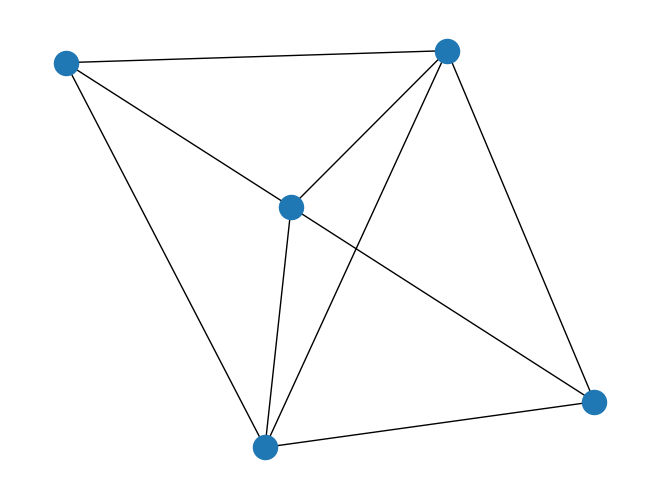

In [4]:
import networkx as nx

trial_id = 1510
trial = db.get_trial(trial_id=trial_id)
problem = db.get_problem_instance(instance_id=trial.instance_id)
num_vars = problem.nodes
compiler_name = trial.compiler_name
grover_iters = trial.trial_params['grover_iterations']
clique_size = trial.trial_params['clique_size']
print(f'{problem.clique_counts[clique_size]} Cliques')
print(f'Compile Type: {compiler_name}')
print(f'{num_vars} Inputs')
print(f'Searching for size {clique_size} clique')
print(f'{grover_iters} Grover Iterations')
#print(f'Expected Success Rate {db.calculate_trial_expected_success_rate(trial)}%')
#print(f'Success Rate {db.calculate_trial_success_rate(trial)}%')

G = nx.from_numpy_array(problem.as_adjacency_matrix())
display(nx.draw(G))
print(problem.as_adjacency_matrix())

1 & (~((vertices[1]) & (vertices[4])))


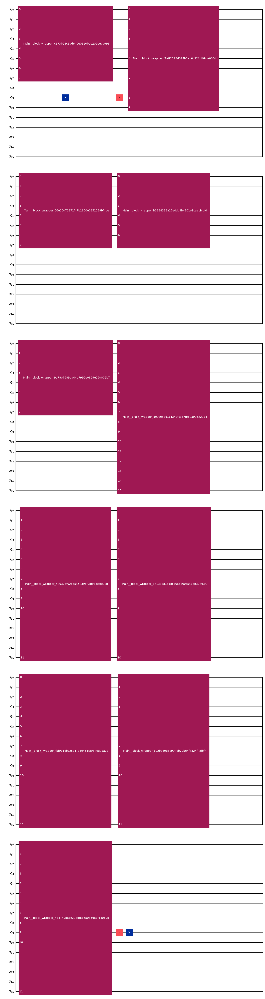

In [5]:
from IPython.display import display # Import the display function
import qiskit
from benchmarklib.compilers import ClassiqCompiler

compiler = ClassiqCompiler()

phase_oracle, oracle = compiler.compile(problem, clique_size=3)


rpi_qc = qiskit.transpile(phase_oracle, backend=backend, optimization_level=3)
display(phase_oracle.draw('mpl'))
display(rpi_qc.draw('mpl'))

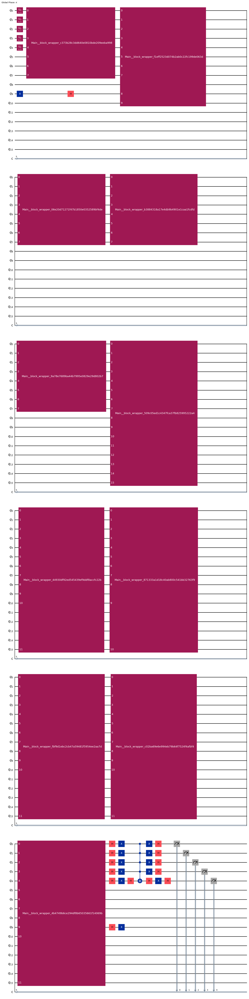

In [9]:
import qiskit
from qiskit.circuit.library import grover_operator
from qiskit_aer import AerSimulator

def build_grover_circuit(oracle: qiskit.QuantumCircuit, num_vars: int, grover_iterations: int) -> qiskit.QuantumCircuit:

        # Build Grover operator
        grover_op = grover_operator(oracle, reflection_qubits=range(num_vars))

        # Create search circuit
        search_circuit = qiskit.QuantumCircuit(oracle.num_qubits, num_vars)

        # hadamard all qubits
        search_circuit.h(range(num_vars))

        # Apply Grover operator
        if grover_iterations > 0:
            search_circuit.compose(grover_op.repeat(grover_iterations), inplace=True)

        # Measure
        search_circuit.measure(range(num_vars), range(num_vars))

        return search_circuit

grover = build_grover_circuit(phase_oracle, num_vars, grover_iters)
grover = grover.decompose()

display(grover.draw('mpl'))

In [10]:
from typing import Optional, Dict

def run_simulation(circuit: qiskit.QuantumCircuit) -> Optional[Dict[str, int]]:
    simulator = AerSimulator()
    
    try:
        # Transpile for simulator
        qc = qiskit.transpile(
            circuit,
            simulator,
            optimization_level=3,
        )

        # Run simulation
        result = simulator.run(qc, shots=10**4).result()
        counts = result.get_counts()

        print(f"Simulation completed: {len(counts)} unique outcomes")
        return counts

    except Exception as e:
        print(f"Simulation failed: {e}")
        return None

sim_counts = run_simulation(circuit=grover)

Simulation completed: 32 unique outcomes


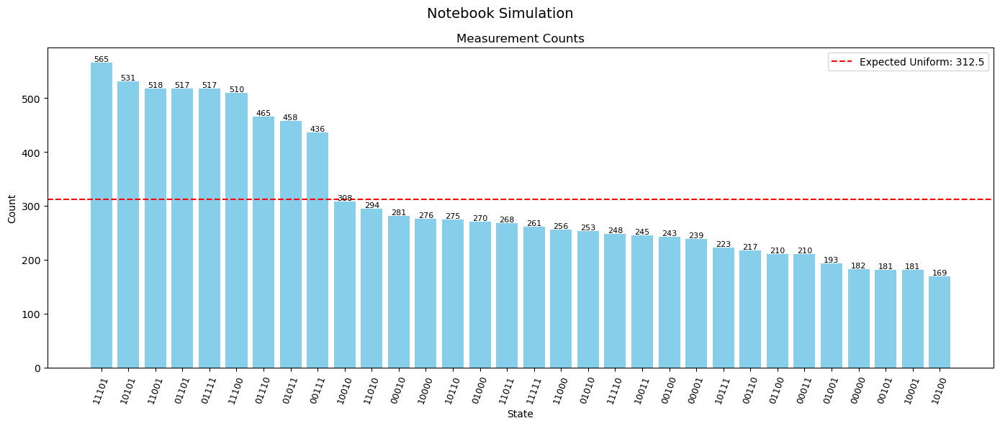

Total samples: 10000
Highest state: 11101 (565 counts, 5.65%)
Lowest state: 10100 (169 counts, 1.69%)
⚠ No clear winner detected. Top state has only 5.7% probability
⚠ Distribution appears close to uniform (max variation: 2.5%)


{'total_samples': 10000, 'top_state': '11101', 'top_probability': 0.0565}

AttributeError: 'NoneType' object has no attribute 'values'

In [11]:
import matplotlib.pyplot as plt
import numpy as np

def simple_visualize_results(results_dict, title="Quantum Measurement Results"):
    # Basic calculations
    total_samples = sum(results_dict.values())
    n_qubits = len(list(results_dict.keys())[0])
    
    # Sort results by count (descending)
    sorted_results = dict(sorted(results_dict.items(), key=lambda x: x[1], reverse=True))
    
    # Create figure with two subplots
    fig, ax1 = plt.subplots(figsize=(14, 6))
    
    # 1. Bar chart of states
    bars = ax1.bar(range(len(sorted_results)), sorted_results.values(), color='skyblue')
    
    # Add value labels on top of bars
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                f'{int(height)}', ha='center', va='bottom', fontsize=8)
    
    # Set the x-tick positions and labels
    ax1.set_xticks(range(len(sorted_results)))
    ax1.set_xticklabels(list(sorted_results.keys()), rotation=70, fontsize=9)
    
    # Add uniform expectation line
    expected_uniform = total_samples / len(results_dict)
    ax1.axhline(y=expected_uniform, color='red', linestyle='--', 
                label=f'Expected Uniform: {expected_uniform:.1f}')
    
    ax1.set_title('Measurement Counts')
    ax1.set_xlabel('State')
    ax1.set_ylabel('Count')
    ax1.legend()
    
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # Print simple statistics
    print(f"Total samples: {total_samples}")
    print(f"Highest state: {list(sorted_results.keys())[0]} ({list(sorted_results.values())[0]} counts, {list(sorted_results.values())[0]/total_samples*100:.2f}%)")
    print(f"Lowest state: {list(sorted_results.keys())[-1]} ({list(sorted_results.values())[-1]} counts, {list(sorted_results.values())[-1]/total_samples*100:.2f}%)")
    
    # Check for clear winner (probability > 20%)
    top_prob = list(sorted_results.values())[0] / total_samples
    if top_prob > 0.2:
        print(f"✓ Strong signal detected in state {list(sorted_results.keys())[0]} ({top_prob*100:.1f}%)")
    else:
        print(f"⚠ No clear winner detected. Top state has only {top_prob*100:.1f}% probability")
    
    # Check for uniformity
    uniformity_threshold = 0.05  # 5% variation
    max_variation = max(abs(count/total_samples - 1/len(results_dict)) for count in results_dict.values())
    
    if max_variation < uniformity_threshold:
        print(f"⚠ Distribution appears close to uniform (max variation: {max_variation*100:.1f}%)")
    
    # Return a simple summary for programmatic use
    return {
        "total_samples": total_samples,
        "top_state": list(sorted_results.keys())[0],
        "top_probability": top_prob,
    }

# from this notebook
display(simple_visualize_results(sim_counts, "Notebook Simulation"))

# from the trial
display(simple_visualize_results(trial.simulation_counts, "Trial Simulation"))
display(simple_visualize_results(trial.counts, "Hardware Results"))

In [ ]:
from typing import List
from qiskit.quantum_info import Statevector

N = num_vars
k = clique_size

oracle_decomped = oracle.decompose(reps=19)

def classical_oracle(vertices: List[int]) -> bool:
    cond = 1

    for i in range(N):
        for j in range(i+1, N):
            if not G.has_edge(i, j):
                cond &= ~(vertices[i] & vertices[j])

    counter = 0
    for v in vertices:
        counter += v

    return cond & (counter >= k)

for input in range(2**N):
    # create input bitstring -- reverse to match qiskit ordering
    input_bitstr = format(input, f'0{N}b')[::-1]
    vertices = [int(i) for i in input_bitstr]

    # qiskit state vector simulation
    sv = Statevector.from_int(input, 2**oracle_decomped.num_qubits)
    sv_input = sv.draw(output='latex_source')[2:2 + oracle_decomped.num_qubits]
    sv = sv.evolve(oracle_decomped)
    #sv_out = sv.draw(output='latex_source')[2:2 + oracle_decomped.num_qubits]
    sv_out = sv.draw(output='latex_source')

    print(f"{input_bitstr} -> {classical_oracle(vertices)} \t\t {sv_input} -> {sv_out}")

00000 -> 0 		 0000000000000000 ->  |0000000000000000\rangle
10000 -> 0 		 0000000000000001 ->  |0000000000000001\rangle
01000 -> 0 		 0000000000000010 ->  |0000000000000010\rangle
11000 -> 1 		 0000000000000011 ->  |0000000000000011\rangle
00100 -> 0 		 0000000000000100 ->  |0000000000000100\rangle
10100 -> 1 		 0000000000000101 ->  |0000000000000101\rangle
01100 -> 1 		 0000000000000110 ->  |0000000000000110\rangle
11100 -> 1 		 0000000000000111 ->  |0000001000000111\rangle
00010 -> 0 		 0000000000001000 ->  |0000000000001000\rangle
10010 -> 1 		 0000000000001001 ->  |0000000000001001\rangle
01010 -> 1 		 0000000000001010 ->  |0000000000001010\rangle
11010 -> 1 		 0000000000001011 ->  |0000001000001011\rangle
00110 -> 1 		 0000000000001100 ->  |0000000000001100\rangle
10110 -> 1 		 0000000000001101 ->  |0000001000001101\rangle
01110 -> 1 		 0000000000001110 ->  |0000001000001110\rangle
11110 -> 1 		 0000000000001111 ->  |0000001000001111\rangle
00001 -> 0 		 0000000000010000 ->  |0000

## Plot

In [ ]:
from benchmarklib.analysis import analyze_success_rates

save_dir = "plots"
analyze_success_rates(db, [CompileType.CLASSICAL_FUNCTION, CompileType.XAG], save_dir=save_dir)

In [ ]:
from benchmarklib.analysis import *

analyze_quantum_advantage(db, save_dir="./plots")

# Direct correlation test
plot_noise_penalty_analysis(db, CompileType.XAG, "noise_penalty.png")

# 2D landscape view  
plot_iteration_efficiency_heatmap(db, CompileType.XAG, "heatmap.png")

Analyzing quantum advantage for CLIQUE problems:
  Total instances: 9000
  Completed trials: 485

n=3 bits, k=1 iterations (26 trials)
  Mean quantum advantage factor: 3.02
  Quantum advantage retained
n=4 bits, k=1 iterations (29 trials)
  Mean quantum advantage factor: 1.62
  Quantum advantage retained
n=4 bits, k=2 iterations (9 trials)
  Mean quantum advantage factor: 0.57
  Quantum advantage lost
n=5 bits, k=1 iterations (33 trials)
  Mean quantum advantage factor: 1.08
  Quantum advantage retained
n=5 bits, k=2 iterations (24 trials)
  Mean quantum advantage factor: 0.51
  Quantum advantage lost
n=5 bits, k=3 iterations (14 trials)
  Mean quantum advantage factor: 0.33
  Quantum advantage lost
n=6 bits, k=1 iterations (32 trials)
  Mean quantum advantage factor: 1.01
  Quantum advantage retained
n=6 bits, k=2 iterations (21 trials)
  Mean quantum advantage factor: 0.50
  Quantum advantage lost
n=6 bits, k=3 iterations (9 trials)
  Mean quantum advantage factor: 0.32
  Quantum adv

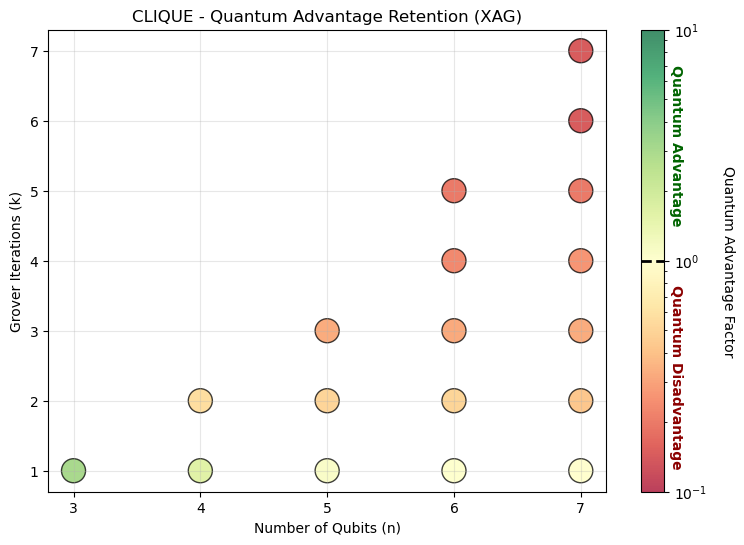

In [ ]:
from benchmarklib.analysis import quantum_advantage

quantum_advantage(db, [CompileType.XAG], 'plots')